# A MULTI-OBJECTIVE APPROACH FOR PRACTICAL PORTFOLIO OPTIMIZATION PROBLEM

## Install requirements

In [71]:
from IPython.display import clear_output

In [72]:
# Load Packages
import numpy as np
import pandas as pd
from pandas_datareader import data
import matplotlib.pyplot as plt
%matplotlib inline

## Pull the stock price data

In [73]:
# Import yfinance package
import yfinance as yf
from datetime import date


# Set the start and end date
start_date = '2018-01-01' #'2015-01-01'
end_date = date.today()   #'2022-07-12'

# Set the ticker
# ticker = ['AMZN', 'SPY', 'TSLA', 'FB']


ticker = ['SPY', 'JCI', 'CMCSA', 'CPB', 'MO', 'MMC', 'JPM',
          'ZION', 'PSA', 'BAX', 'BMY', 'LUV', 'PCAR', 'TXT', 'TMO',
          'DE', 'MSFT', 'HPQ', 'SEE', 'VZ', 'CNP', 'NI', 'T']

# Get the data
data = yf.download(ticker, start_date, end_date)
pd.set_option('display.max_columns', None)
# pd.set_option('display.max_rows', None)

data

[*********************100%***********************]  23 of 23 completed


Price           Close                                                          \
Ticker            BAX        BMY      CMCSA        CNP        CPB          DE   
Date                                                                            
2018-01-02  59.502460  47.852196  34.638313  22.482254  37.491783  142.165329   
2018-01-03  60.459198  47.891220  34.081676  22.434109  36.961731  142.813126   
2018-01-04  60.600918  48.511852  34.300957  22.458183  37.270283  143.631882   
2018-01-05  61.283024  48.621849  34.613018  22.361895  37.412678  144.243713   
2018-01-08  61.371616  48.637562  34.140713  22.498302  37.681656  144.954483   
2018-01-09  61.460213  48.590424  34.250366  22.273632  37.697609  148.994217   
2018-01-10  60.618652  48.716137  34.655193  21.872454  36.518059  148.400375   
2018-01-11  60.645214  49.077515  35.928715  22.008860  36.462265  150.667740   
2018-01-12  60.538914  49.344612  35.793777  21.960714  36.270996  152.323196   
2018-01-16  59.945389  47.074184  35.270863  22.081068  37.012192  150.739685   
2018-01-17  60.414894  48.590424  35.152790  22.369919  37.426624  150.640747   
2018-01-18  61.300724  48.574711  35.296177  22.329803  36.860764  151.063568   
2018-01-19  62.018276  48.928234  35.844383  22.305733  37.769341  153.240921   
2018-01-22  62.186600  49.713840  36.173306  22.297712  37.976547  153.294907   
2018-01-23  61.655090  49.831692  35.793777  22.530394  37.912785  151.747452   
2018-01-24  62.133438  50.090950  36.257656  22.578533  37.538208  152.593109   
2018-01-25  62.939560  49.902401  35.540752  22.771099  37.825130  152.170288   
2018-01-26  64.011452  50.475903  36.097401  22.835289  37.729477  154.293564   
2018-01-29  63.825436  50.617317  35.405823  22.249567  37.418659  152.215240   
2018-01-30  63.559654  50.248077  35.709442  22.321775  36.980309  151.612427   
2018-01-31  63.807686  49.179634  35.869690  22.610628  37.099865  149.732025   
2018-02-01  61.965141  49.336761  35.329903  22.241541  37.283169  151.018631   
2018-02-02  60.724953  49.870972  34.672054  22.105137  35.545719  148.418411   
2018-02-05  58.040813  47.891216  33.061169  21.591623  35.242878  141.274612   
2018-02-06  59.059544  47.844086  33.457561  21.118237  35.976105  145.647278   
2018-02-07  58.067402  49.203209  33.862404  21.150330  35.705132  145.251389   
2018-02-08  55.418709  49.250343  32.209339  20.741125  35.729042  138.251526   
2018-02-09  56.968948  49.258198  32.529827  21.262659  36.446331  139.394180   
2018-02-12  57.580189  49.619583  32.504532  21.447203  36.908577  143.245041   
2018-02-13  57.252419  50.177357  32.858753  21.479301  37.179558  145.125443   
2018-02-14  58.492611  51.340076  33.255154  21.234442  37.426624  146.906876   
2018-02-15  58.855804  54.191872  33.803352  21.696587  38.016396  150.082886   
2018-02-16  58.758373  54.176167  33.558784  21.818203  36.797001  152.449188   
2018-02-20  59.387306  52.911316  33.288883  21.672264  36.725288  148.247467   
2018-02-21  59.396187  52.267105  32.900925  21.266870  34.190842  145.836212   
2018-02-22  59.732803  51.803593  32.723812  21.891180  35.035648  147.698639   
2018-02-23  60.556641  53.382683  33.314190  22.483046  35.163181  149.570068   
2018-02-26  61.247612  53.916904  33.381664  22.531696  35.362423  150.667740   
2018-02-27  60.848965  53.296272  30.918947  22.093870  35.019714  147.176804   
2018-02-28  60.051701  52.007854  30.539412  21.931713  34.310398  144.738541   
2018-03-01  58.879601  51.607201  30.817726  21.664154  33.696716  141.085663   
2018-03-02  58.852970  51.984291  30.775560  21.639833  33.489498  137.936600   
2018-03-05  59.359108  52.494946  31.020153  22.012793  34.684982  141.742508   
2018-03-06  59.501171  51.434364  31.096062  21.704697  34.987850  142.615173   
2018-03-07  59.510052  51.929295  30.463507  21.656052  34.334309  142.066406   
2018-03-08  60.220425  52.439953  31.104490  21.964144  34.382133  144.909485   
2018-03-09  61.170506  53.35911

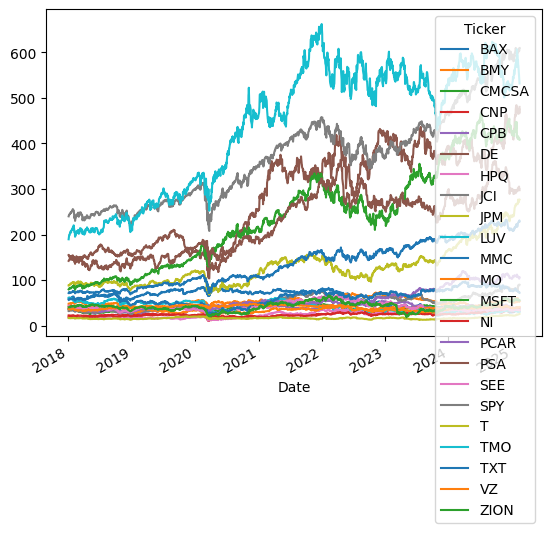

In [74]:
# Plot adjusted close price data
data['Close'].plot()
plt.show()

In [75]:
# Closing price
data = data['Close']
data

Ticker,BAX,BMY,CMCSA,CNP,CPB,DE,HPQ,JCI,JPM,LUV,MMC,MO,MSFT,NI,PCAR,PSA,SEE,SPY,T,TMO,TXT,VZ,ZION
Date,,,,,,,,,,,,,,,,,,,,,,,
2018-01-02,59.502460,47.852196,34.638313,22.482254,37.491783,142.165329,17.090263,32.212494,88.111290,61.270447,71.543571,41.779469,79.633522,19.902189,36.564091,155.131638,43.847252,239.993774,16.792316,189.610168,56.757004,36.562729,40.311043
2018-01-03,60.459198,47.891220,34.081676,22.434109,36.961731,142.813126,17.130346,32.827583,88.201073,59.994942,72.477921,41.625912,80.004097,19.776621,37.009750,155.470032,43.882744,241.511795,16.404537,193.088348,57.083897,35.811398,40.263313
2018-01-04,60.600918,48.511852,34.300957,22.458183,37.270283,143.631882,17.258604,33.577499,89.464584,59.800827,73.234283,41.460533,80.708275,19.690296,37.480442,152.718063,43.980343,242.529694,16.557032,195.505356,57.034370,35.927517,40.430298
2018-01-05,61.283024,48.621849,34.613018,22.361895,37.412678,144.243713,17.434958,32.372574,88.890274,59.449608,73.741516,41.578671,81.708900,19.454863,37.605633,151.823288,43.847252,244.145981,16.618040,198.855835,57.945656,35.845554,40.446198
2018-01-08,61.371616,48.637562,34.140713,22.498302,37.681656,144.954483,17.507101,32.810730,89.021530,59.153847,72.958435,41.525509,81.792267,19.619667,37.485455,153.033875,44.042442,244.592438,16.665966,199.180038,57.797070,35.784077,40.247417
2018-01-09,61.460213,48.590424,34.250366,22.273632,37.697609,148.994217,17.483053,32.650639,89.472816,57.656509,72.958435,41.088463,81.736679,19.384233,37.470436,151.244308,43.447998,245.145981,16.622509,202.501053,57.896111,35.652828,41.193581
2018-01-10,60.618652,48.716137,34.655193,21.872454,36.518059,148.400375,17.675444,32.911850,90.457352,58.192593,72.219864,41.513702,81.366104,18.936899,37.109905,147.454773,43.172947,244.770996,16.236767,202.687729,57.846592,35.708084,41.622932
2018-01-11,60.645214,49.077515,35.928715,22.008860,36.462265,150.667740,17.964020,33.333141,90.941460,59.930233,72.095291,41.513702,81.606987,18.936899,37.840992,147.462265,43.164082,246.556900,16.174690,205.016312,58.530064,35.998234,42.227203
2018-01-12,60.538914,49.344612,35.793777,21.960714,36.270996,152.323196,18.372841,33.535358,92.442932,60.410858,72.735977,41.112080,83.015282,18.889814,38.256596,145.529877,43.350403,248.164154,16.360914,206.499939,59.580013,35.825527,42.362366


<Axes: xlabel='Ticker'>

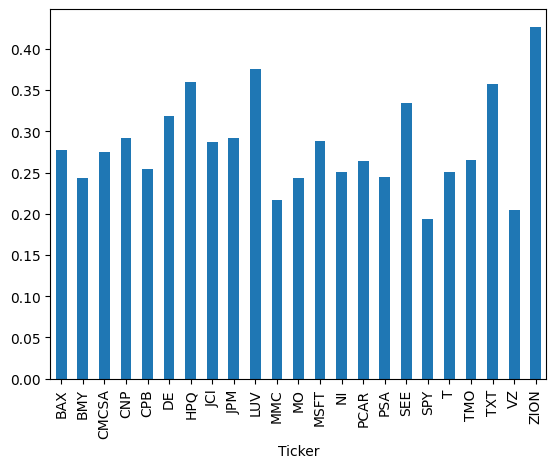

In [76]:
# Volatility of stocks
data.pct_change().apply(lambda x: np.log(1+x)).std().apply(lambda x: x*np.sqrt(250)).plot(kind='bar')

## Process on all dataset


In [77]:
# Log of percentage change
cov_matrix = data.pct_change().apply(lambda x: np.log(1+x)).cov()
cov_matrix

Ticker,BAX,BMY,CMCSA,CNP,CPB,DE,HPQ,JCI,JPM,LUV,MMC,MO,MSFT,NI,PCAR,PSA,SEE,SPY,T,TMO,TXT,VZ,ZION
Ticker,,,,,,,,,,,,,,,,,,,,,,,
BAX,0.000307,0.000082,0.000112,0.000109,0.000065,0.000108,0.000112,0.000093,0.000119,0.000099,0.000088,0.000074,0.000116,0.000097,0.000087,0.000086,0.000097,0.000104,0.000096,0.000133,0.000120,0.000079,0.000132
BMY,0.000082,0.000236,0.000084,0.000092,0.000052,0.000095,0.000083,0.000076,0.000091,0.000088,0.000079,0.000080,0.000080,0.000076,0.000070,0.000062,0.000093,0.000078,0.000077,0.000093,0.000105,0.000055,0.000099
CMCSA,0.000112,0.000084,0.000303,0.000122,0.000040,0.000138,0.000160,0.000129,0.000161,0.000164,0.000102,0.000097,0.000144,0.000103,0.000121,0.000077,0.000136,0.000128,0.000130,0.000086,0.000187,0.000090,0.000181
CNP,0.000109,0.000092,0.000122,0.000340,0.000072,0.000148,0.000151,0.000139,0.000168,0.000164,0.000133,0.000104,0.000114,0.000209,0.000112,0.000132,0.000163,0.000126,0.000123,0.000093,0.000195,0.000089,0.000171
CPB,0.000065,0.000052,0.000040,0.000072,0.000260,0.000029,0.000028,0.000039,0.000039,0.000019,0.000050,0.000074,0.000040,0.000075,0.000050,0.000069,0.000048,0.000040,0.000061,0.000047,0.000036,0.000062,0.000024
DE,0.000108,0.000095,0.000138,0.000148,0.000029,0.000406,0.000227,0.000188,0.000212,0.000213,0.000120,0.000108,0.000139,0.000111,0.000197,0.000094,0.000186,0.000152,0.000120,0.000114,0.000267,0.000073,0.000245
HPQ,0.000112,0.000083,0.000160,0.000151,0.000028,0.000227,0.000518,0.000200,0.000217,0.000217,0.000135,0.000104,0.000195,0.000109,0.000177,0.000094,0.000202,0.000178,0.000122,0.000130,0.000260,0.000077,0.000259
JCI,0.000093,0.000076,0.000129,0.000139,0.000039,0.000188,0.000200,0.000330,0.000196,0.000197,0.000129,0.000095,0.000137,0.000105,0.000175,0.000100,0.000179,0.000147,0.000103,0.000114,0.000245,0.000062,0.000244
JPM,0.000119,0.000091,0.000161,0.000168,0.000039,0.000212,0.000217,0.000196,0.000342,0.000235,0.000143,0.000115,0.000148,0.000117,0.000183,0.000081,0.000190,0.000161,0.000138,0.000108,0.000281,0.000082,0.000340


In [78]:
# Yearly returns for individual companies
ind_er = data.resample('Y').last().pct_change().mean()
ind_er

<ipython-input-78-3c8ec0b37881>:2: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  ind_er = data.resample('Y').last().pct_change().mean()


,0
Ticker,
BAX,-0.063237
BMY,0.051454
CMCSA,0.049435
CNP,0.060722
CPB,0.078910
DE,0.210163
HPQ,0.128727
JCI,0.232341
JPM,0.211033


In [79]:
# Volatility is given by the annual standard deviation. We multiply by 250 because there are 250 trading days/year.
ann_sd = data.pct_change().apply(lambda x: np.log(1+x)).std().apply(lambda x: x*np.sqrt(250))
ann_sd

,0
Ticker,
BAX,0.276849
BMY,0.243119
CMCSA,0.275226
CNP,0.291573
CPB,0.254781
DE,0.318647
HPQ,0.359998
JCI,0.287426
JPM,0.292452


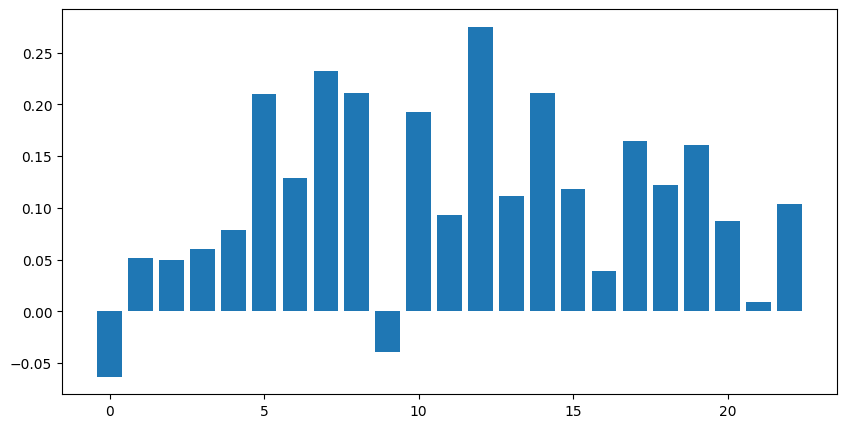

DONE


<Figure size 1000x1000 with 0 Axes>

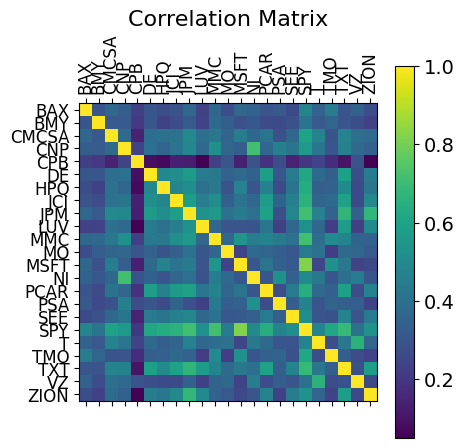

In [80]:
mu = np.array(ind_er)
cov = np.array(cov_matrix)

corr_matrix = data.pct_change().apply(lambda x: np.log(1+x)).corr()
labels = data.columns

import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(10, 5))
k = np.arange(len(mu))
ax.bar(k, mu)
plt.show()


f = plt.figure(figsize=(10, 10))
plt.matshow(corr_matrix)
plt.xticks(k, labels, fontsize=12, rotation=90)
plt.yticks(k, labels, fontsize=12)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Correlation Matrix', fontsize=16)
print("DONE")

## Solve problem with NSGA_II

In [81]:
# import libs
from pymoo.core.problem import ElementwiseProblem
from pymoo.core.repair import Repair
from pymoo.algorithms.moo.sms import SMSEMOA
from pymoo.algorithms.moo.nsga2 import NSGA2
from pymoo.optimize import minimize
import operator

In [82]:
class PortfolioProblem(ElementwiseProblem):

    def __init__(self, mu, cov, risk_free_rate=0.02, **kwargs):
        super().__init__(n_var=len(np.array(ticker)), n_obj=2, xl=0.0, xu=1.0, **kwargs)
        self.mu = mu
        self.cov = cov
        self.risk_free_rate = risk_free_rate

    def _evaluate(self, x, out, *args, **kwargs):
        exp_return = x @ self.mu
        exp_risk = np.sqrt(x.T @ self.cov @ x) * np.sqrt(250.0)
        sharpe = (exp_return - self.risk_free_rate) / exp_risk

        out["F"] = [exp_risk, -exp_return]
        out["sharpe"] = sharpe

In [83]:

class PortfolioRepair(Repair):

    def _do(self, problem, X, **kwargs):
        X[X < 1e-3] = 0
        return X / X.sum(axis=1, keepdims=True)

In [84]:
%%time
problem = PortfolioProblem(mu, cov)
algorithm = NSGA2(repair=PortfolioRepair())

res = minimize(problem,
               algorithm,
               seed=1,
               verbose=False)

CPU times: user 9.41 s, sys: 24 ms, total: 9.44 s
Wall time: 9.48 s


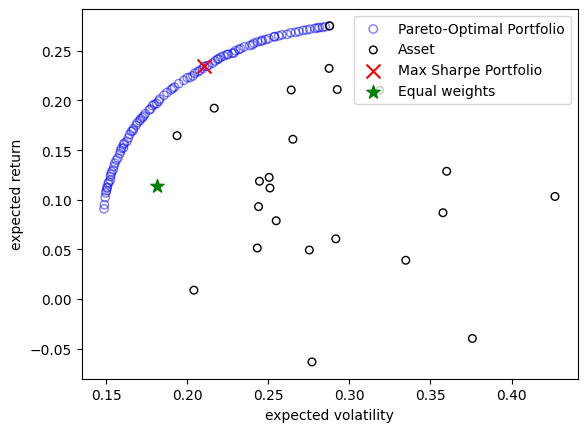

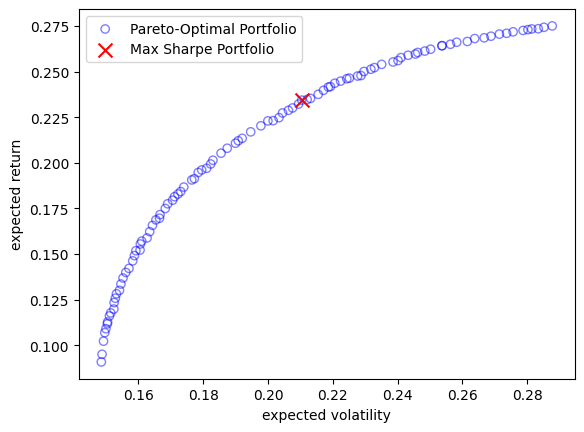

In [85]:
X, F, sharpe = res.opt.get("X", "F", "sharpe")
F = F * [1, -1]
max_sharpe = sharpe.argmax()

# equal weights
x = np.zeros((len(ticker), 1))
x = x + 1.0/len(x)

plt.scatter(F[:, 0], F[:, 1], facecolor="none", edgecolors="blue", alpha=0.5, label="Pareto-Optimal Portfolio")
plt.scatter(cov.diagonal() ** 0.5 * np.sqrt(250.0), mu, facecolor="none", edgecolors="black", s=30, label="Asset")
plt.scatter(F[max_sharpe, 0], F[max_sharpe, 1], marker="x", s=100, color="red", label="Max Sharpe Portfolio")
plt.scatter(np.sqrt(x.T @ cov @ x) * np.sqrt(250.0), x.T @ mu, marker="*", s=100, color="green", label="Equal weights")
plt.legend()
plt.xlabel("expected volatility")
plt.ylabel("expected return")
plt.show()

plt.scatter(F[:, 0], F[:, 1], facecolor="none", edgecolors="blue", alpha=0.5, label="Pareto-Optimal Portfolio")
plt.scatter(F[max_sharpe, 0], F[max_sharpe, 1], marker="x", s=100, color="red", label="Max Sharpe Portfolio")
plt.legend()
plt.xlabel("expected volatility")
plt.ylabel("expected return")
plt.show()

In [86]:
allocation = {name: w for name, w in zip(data.columns, X[max_sharpe])}
allocation = sorted(allocation.items(), key=operator.itemgetter(1), reverse=True)

print("Allocation With Best Sharpe")
for name, w in allocation:
    print(f"{name:<5} {w}")

Allocation With Best Sharpe
MSFT  0.3809197165959069
MMC   0.2312651261982788
JCI   0.20565633417679244
PCAR  0.17123953849495832
CPB   0.00561898679791509
PSA   0.0027274223861212437
DE    0.002572875350027169
BAX   0.0
BMY   0.0
CMCSA 0.0
CNP   0.0
HPQ   0.0
JPM   0.0
LUV   0.0
MO    0.0
NI    0.0
SEE   0.0
SPY   0.0
T     0.0
TMO   0.0
TXT   0.0
VZ    0.0
ZION  0.0


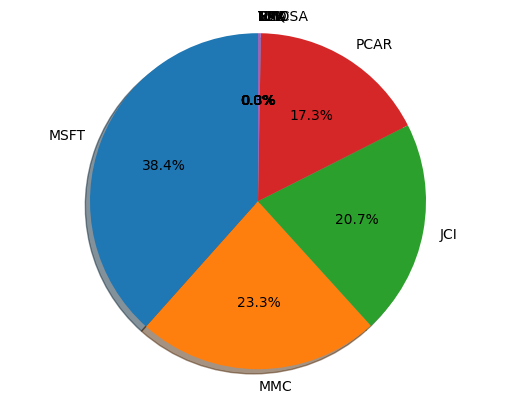

In [87]:
for al in allocation:
    if al[1] <= 1e-2:
        allocation.remove(al)

col_name = []
w1 = []
for name, w in allocation:
    col_name.append(name)
    w1.append(w)

fig1, ax1 = plt.subplots()
ax1.pie(w1, labels=col_name, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()

In [88]:
x = np.zeros((len(ticker), 1))
x = x + 1.0/len(x)

print("For equal weights: \nReturn     = ", (x.T @ mu)[0])
print("Volatility = ", (np.sqrt(x.T @ cov @ x) * np.sqrt(250.0))[0][0])

For equal weights: 
Return     =  0.11340133846113942
Volatility =  0.1812387708040036


In [89]:
x = X[max_sharpe].T

print("Best Sharpe: \nReturn     = ", x.T @ mu)
print("Volatility = ", np.sqrt(x.T @ cov @ x) * np.sqrt(250.0))

Best Sharpe: 
Return     =  0.23440642448595372
Volatility =  0.21040197793504017


## Solve problem with SMS-EMOA

In [90]:
class PortfolioProblem(ElementwiseProblem):

    def __init__(self, mu, cov, risk_free_rate=0.02, **kwargs):
        super().__init__(n_var=len(np.array(ticker)), n_obj=2, xl=0.0, xu=1.0, **kwargs)
        self.mu = mu
        self.cov = cov
        self.risk_free_rate = risk_free_rate

    def _evaluate(self, x, out, *args, **kwargs):
        exp_return = x @ self.mu
        exp_risk = np.sqrt(x.T @ self.cov @ x) * np.sqrt(250.0)
        sharpe = (exp_return - self.risk_free_rate) / exp_risk

        out["F"] = [exp_risk, -exp_return]
        out["sharpe"] = sharpe

In [91]:
class PortfolioRepair(Repair):

    def _do(self, problem, X, **kwargs):
        X[X < 1e-3] = 0
        return X / X.sum(axis=1, keepdims=True)

In [92]:
%%time
problem = PortfolioProblem(mu, cov)

algorithm = SMSEMOA(repair=PortfolioRepair())

res = minimize(problem,
               algorithm,
               seed=1,
               verbose=False)

CPU times: user 6.81 s, sys: 41.3 ms, total: 6.85 s
Wall time: 6.83 s


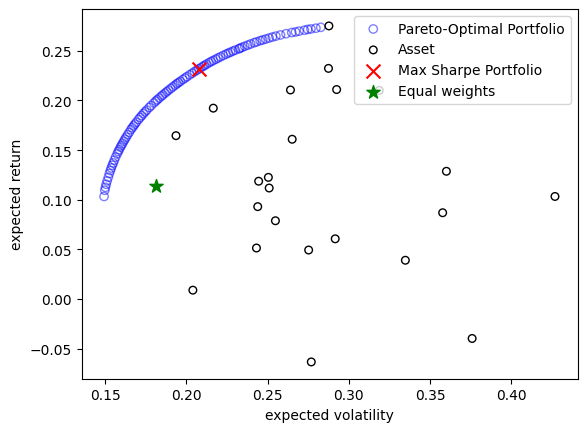

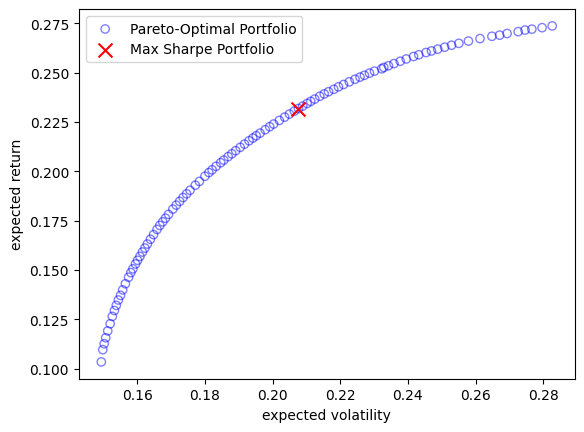

In [93]:
X, F, sharpe = res.opt.get("X", "F", "sharpe")
F = F * [1, -1]
max_sharpe = sharpe.argmax()

# equal weights
x = np.zeros((len(ticker), 1))
x = x + 1.0/len(x)

plt.scatter(F[:, 0], F[:, 1], facecolor="none", edgecolors="blue", alpha=0.5, label="Pareto-Optimal Portfolio")
plt.scatter(cov.diagonal() ** 0.5 * np.sqrt(250.0), mu, facecolor="none", edgecolors="black", s=30, label="Asset")
plt.scatter(F[max_sharpe, 0], F[max_sharpe, 1], marker="x", s=100, color="red", label="Max Sharpe Portfolio")
plt.scatter(np.sqrt(x.T @ cov @ x) * np.sqrt(250.0), x.T @ mu, marker="*", s=100, color="green", label="Equal weights")
plt.legend()
plt.xlabel("expected volatility")
plt.ylabel("expected return")
plt.show()

plt.scatter(F[:, 0], F[:, 1], facecolor="none", edgecolors="blue", alpha=0.5, label="Pareto-Optimal Portfolio")
plt.scatter(F[max_sharpe, 0], F[max_sharpe, 1], marker="x", s=100, color="red", label="Max Sharpe Portfolio")
plt.legend()
plt.xlabel("expected volatility")
plt.ylabel("expected return")
plt.show()

In [94]:
allocation = {name: w for name, w in zip(data.columns, X[max_sharpe])}
allocation = sorted(allocation.items(), key=operator.itemgetter(1), reverse=True)

print("Allocation With Best Sharpe")
for name, w in allocation:
    print(f"{name:<5} {w}")

Allocation With Best Sharpe
MSFT  0.39024188763338535
MMC   0.2351189975501172
JCI   0.16897706254848038
PCAR  0.1626584502572936
CPB   0.025218998021589636
DE    0.01778460398913362
BAX   0.0
BMY   0.0
CMCSA 0.0
CNP   0.0
HPQ   0.0
JPM   0.0
LUV   0.0
MO    0.0
NI    0.0
PSA   0.0
SEE   0.0
SPY   0.0
T     0.0
TMO   0.0
TXT   0.0
VZ    0.0
ZION  0.0


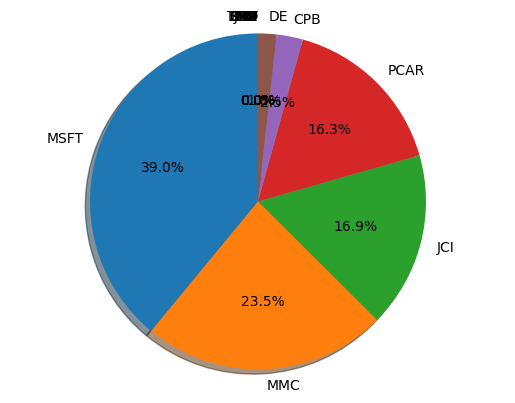

In [95]:
for al in allocation:
    if al[1] <= 1e-2:
        allocation.remove(al)

col_name = []
w1 = []
for name, w in allocation:
    col_name.append(name)
    w1.append(w)

fig1, ax1 = plt.subplots()
ax1.pie(w1, labels=col_name, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()

In [96]:
x = np.zeros((len(ticker), 1))
x = x + 1.0/len(x)

print("For equal weights: \nReturn     = ", (x.T @ mu)[0])
print("Volatility = ", (np.sqrt(x.T @ cov @ x) * np.sqrt(250.0))[0][0])

For equal weights: 
Return     =  0.11340133846113942
Volatility =  0.1812387708040036


In [97]:
x = X[max_sharpe].T

print("Best Sharpe: \nReturn     = ", x.T @ mu)
print("Volatility = ", np.sqrt(x.T @ cov @ x) * np.sqrt(250.0))

Best Sharpe: 
Return     =  0.23180241740914118
Volatility =  0.20764752532859274


In [98]:
# To export jupyter notebook to html, save your notebook and run this cell
!jupyter nbconvert --to html Project_codes.ipynb

[NbConvertApp] WARNING | pattern 'Project_codes.ipynb' matched no files
This application is used to convert notebook files (*.ipynb)
        to various other formats.


Options
The options below are convenience aliases to configurable class-options,
as listed in the "Equivalent to" description-line of the aliases.
To see all configurable class-options for some <cmd>, use:
    <cmd> --help-all

--debug
    set log level to logging.DEBUG (maximize logging output)
    Equivalent to: [--Application.log_level=10]
--show-config
    Show the application's configuration (human-readable format)
    Equivalent to: [--Application.show_config=True]
--show-config-json
    Show the application's configuration (json format)
    Equivalent to: [--Application.show_config_json=True]
--generate-config
    generate default config file
    Equivalent to: [--JupyterApp.generate_config=True]
-y
    Answer yes to any questions instead of prompting.
    Equivalent to: [--JupyterApp.answer_yes=True]
--execute
 